## Basic config, package loading

In [2]:
### Set CUDA device
import os

os.environ['CUDA_VISIBLE_DEVICES'] = '3'

In [19]:
import torch
from torch import Tensor
import sys
from omegaconf import OmegaConf, open_dict
import matplotlib.pyplot as plt
import seaborn as sns
from typing import List

sys.path.append('../')
from data_utils import get_train_loader, get_eval_data
from model.unet import get_unet
from model.dae import get_daes

In [73]:
### Load basic config
cfg = OmegaConf.load('../configs/basic_config_venusberg.yaml')
OmegaConf.update(cfg, 'run.iteration', 0)

### Load DAE config
OmegaConf.update(cfg, "run.data_key", 'heart')
OmegaConf.update(cfg, "run.iteration", 0)

dae_cfg = OmegaConf.load('../configs/dae/ResMAE_config.yaml')

OmegaConf.update(cfg, "dae", dae_cfg)
with open_dict(cfg):
    cfg.dae.name = 'ResMAE-bottleneck-128'
    # cfg.dae.postfix = '_masked_loss'
    # cfg.dae.postfix = '_masked_perpixel_0-6'
    cfg.dae.postfix = '_masked_loss_0-2'
    cfg.dae.placement = 'bottleneck'
    cfg.dae.arch.depth = 128
    cfg.dae.arch.block = ''
    cfg.dae.arch.residual = False
# OmegaConf.update(cfg, "dae.placement", 'bottleneck')

In [67]:
### Load basic config
cfg = OmegaConf.load('../configs/basic_config_venusberg.yaml')
OmegaConf.update(cfg, 'run.iteration', 0)

### Load DAE config
OmegaConf.update(cfg, "run.data_key", 'heart')
OmegaConf.update(cfg, "run.iteration", 0)

dae_cfg = OmegaConf.load('../configs/dae/ChannelDAE_config.yaml')

OmegaConf.update(cfg, "dae", dae_cfg)
with open_dict(cfg):
    cfg.dae.name = 'ChannelDAE-bottleneck-3-4'
    # cfg.dae.postfix = '_masked_loss'
    # cfg.dae.postfix = '_masked_perpixel_0-6'
    cfg.dae.postfix = ''
    cfg.dae.placement = 'bottleneck'
    cfg.dae.arch.depth = 3
    cfg.dae.arch.block = 4
    cfg.dae.arch.residual = False
# OmegaConf.update(cfg, "dae.placement", 'bottleneck')

## Model selection

In [74]:
### Set dataset, either brain or heart
DATA_KEY = 'heart'
OmegaConf.update(cfg, 'run.data_key', DATA_KEY)


### get model
# available models:
#     - default-8
#     - default-16
#     - monai-8-4-4
#     - monai-16-4-4
#     - monai-16-4-8
#     - monai-32-4-4
#     - monai-64-4-4
#     - swinunetr

unet_name = 'default-8'
args = unet_name.split('-')
cfg.unet[DATA_KEY].pre = unet_name
cfg.unet[DATA_KEY].arch = args[0]
cfg.unet[DATA_KEY].n_filters_init = int(args[1])
if args[0] == 'monai':
    cfg.unet[DATA_KEY].depth = int(args[2])
    cfg.unet[DATA_KEY].num_res_units = int(args[3])

unet, state_dict = get_unet(
    cfg,
    update_cfg_with_swivels=True,
    return_state_dict=True)
unet.load_state_dict(state_dict)
_ = unet.cuda()


### MAE testing

In [75]:
model, state_dict = get_daes(
    unet=unet,
    cfg=cfg,
    return_state_dict=True
)

model.load_state_dict(state_dict)

Disabling layer shortcut0, index 0 in identity_swivels.
Disabling layer shortcut1, index 1 in identity_swivels.
Disabling layer shortcut2, index 2 in identity_swivels.


<All keys matched successfully>

## Everything Data

In [10]:
# Set debug mode for only a small fraction of the datasets. Speeds up this cell by alot
cfg.debug = False

# update config with default values
with open_dict(cfg):
    OmegaConf.update(
        cfg, 
        'eval',
        OmegaConf.load('../configs/eval/unet_config.yaml')
    )

# Wether and how you want to subset in case of Brain data. WARNING:
# After subsetting the eval below will not work with surface
# Dice anymore, because volumes are fragmented. 
APPLY_SUBSETTING = True
OmegaConf.update(cfg, 'eval.data.subset.apply', APPLY_SUBSETTING)
subset_params = {
    'n_cases': 256,  # selects at most so many cases
    'fraction': 0.1, # selects from the 10% worst cases w.r.t to a model
}
OmegaConf.update(
    cfg, 
    'eval.data.subset.params', 
    OmegaConf.create(subset_params)
)

if cfg.eval.data.subset.apply:
    subset_dict = OmegaConf.to_container(
        cfg.eval.data.subset.params, 
        resolve=True, 
        throw_on_missing=True
    )
    subset_dict['unet'] = unet
else:
    subset_dict = None

### select the datasets within the domain
# get training data
cfg.eval.data.training = True
# get validation data
cfg.eval.data.validation = False
# get testing data
# Options for Brain are any subset of [1, 2, 3, 4, 5] or 'all' 
# Options for Heart are any subset of ['A', 'B', 'C', 'D'] or 'all'
# cfg.eval.data.testing = 'all'
cfg.eval.data.testing = ['A']


data = get_eval_data(
    train_set=cfg.eval.data.training,
    val_set=cfg.eval.data.validation,
    test_sets=cfg.eval.data.testing,    
    cfg=cfg,
    subset_dict=subset_dict
)

train_loader, val_loader = get_train_loader(cfg, 'unet')

print(f'\nAvailable datasets are: {list(data.keys())}')

loading dataset
loading all case properties


loading dataset
loading all case properties

Available datasets are: ['train', 'A']


In [11]:
# trainset = data['train']
# valset = data['val']
testset = data['A']

In [70]:
model.remove_all_hooks()
model.hook_inspect_transformation(model.transformations)
model.freeze_seg_model()
model.eval()
model.cuda()
print()

In [71]:
idx = [i for i in range(20)]

data_point = testset[idx]
x_in = data_point['input']
target = data_point['target'].squeeze().detach().cpu()


x_out = model(x_in.cuda()).detach().cpu()
x_out = torch.nn.functional.softmax(x_out, 1)

NotImplementedError: Module [ModuleList] is missing the required "forward" function

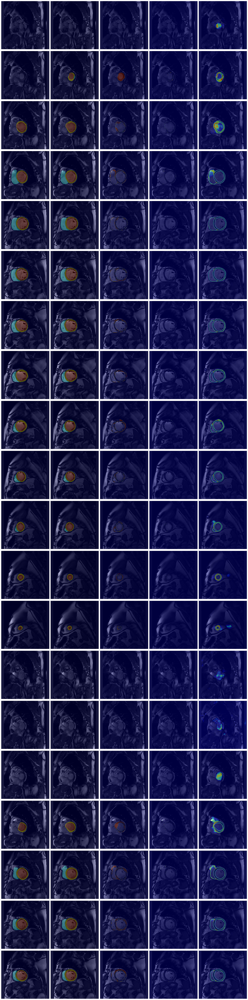

In [72]:
n = len(idx)
x_out_argmax = torch.argmax(x_out, 1)
x_out_unet, x_out_ae = torch.split(x_out_argmax, n)

fig, axes = plt.subplots(n, 5, figsize=(20, n*4))

for i in range(n):
    axes[i, 0].imshow(x_in[i].squeeze(), cmap='gray')
    axes[i, 0].imshow(target[i], cmap='jet', alpha=0.3)
    axes[i, 1].imshow(x_in[i].squeeze(), cmap='gray')
    axes[i, 1].imshow(x_out_unet[i], cmap='jet', alpha=0.3)
    axes[i, 2].imshow(x_in[i].squeeze(), cmap='gray')
    axes[i, 2].imshow(x_out_unet[i] != target[i], cmap='jet', alpha=0.4)
    axes[i, 3].imshow(x_in[i].squeeze(), cmap='gray')
    axes[i, 3].imshow(x_out_unet[i] != x_out_ae[i], cmap='jet', alpha=0.5)
    axes[i, 4].imshow(x_in[i].squeeze(), cmap='gray')
    axes[i, 4].imshow(torch.special.entr(x_out[i]).sum(0), cmap='jet', alpha=0.5)


for ax in axes.ravel():
    ax.set_axis_off()
plt.tight_layout()

In [15]:
from model.mahalanobis_adatper import get_pooling_mahalanobis_detector
from torch.utils.data import DataLoader

In [25]:
pooling_wrapper = get_pooling_mahalanobis_detector(
   swivels=['up3'],
    unet=unet,
    ledoitWolf=False,
    fit='augmented', # None, 'raw', 'augmented'
    # iid_data=DataLoader(data['train'], batch_size=32, shuffle=False, drop_last=False),
    iid_data=train_loader,
    device='cuda:0',
)

In [41]:
train_loader_orig = DataLoader(data['train'], batch_size=32, shuffle=False, drop_last=False)
test_loader = DataLoader(testset, batch_size=32, shuffle=False, drop_last=False)

in_dists = []
out_dists = []

for batch in test_loader:
    x_in = batch['input']
    x_out = model(x_in.cuda()).detach().cpu()
    act_in = model.inspect_data['up3']['input'].squeeze().detach().cpu()
    act_out = model.inspect_data['up3']['output'].squeeze().detach().cpu()
    in_dists.append(pooling_wrapper.adapters[0]._distance(act_in.cuda()).detach().cpu())
    out_dists.append(pooling_wrapper.adapters[0]._distance(act_out.cuda()).detach().cpu())

in_dists = torch.cat(in_dists, dim=0)
out_dists = torch.cat(out_dists, dim=0)

print(in_dists.median(), out_dists.median())

tensor(43.7299) tensor(50.9237)


In [42]:
in_dists = []
out_dists = []

for batch in train_loader_orig:
    x_in = batch['input']
    x_out = model(x_in.cuda()).detach().cpu()
    act_in = model.inspect_data['up3']['input'].squeeze().detach().cpu()
    act_out = model.inspect_data['up3']['output'].squeeze().detach().cpu()
    in_dists.append(pooling_wrapper.adapters[0]._distance(act_in.cuda()).detach().cpu())
    out_dists.append(pooling_wrapper.adapters[0]._distance(act_out.cuda()).detach().cpu())

in_dists = torch.cat(in_dists, dim=0)
out_dists = torch.cat(out_dists, dim=0)

print(in_dists.median(), out_dists.median())

tensor(30.7009) tensor(41.7209)


In [67]:
in_dist = pooling_wrapper.adapters[0]._distance(act_in.cuda()).detach().cpu()
out_dist = pooling_wrapper.adapters[0]._distance(act_out.cuda()).detach().cpu()

In [68]:
print(in_dist.nanmean(), out_dist.nanmean())

tensor(230.0411) tensor(270.3724)


In [65]:
act_in = model.inspect_data['up3']['input'].squeeze().detach().cpu()
act_out = model.inspect_data['up3']['output'].squeeze().detach().cpu()

In [66]:
act_in.shape

torch.Size([20, 64, 32, 32])

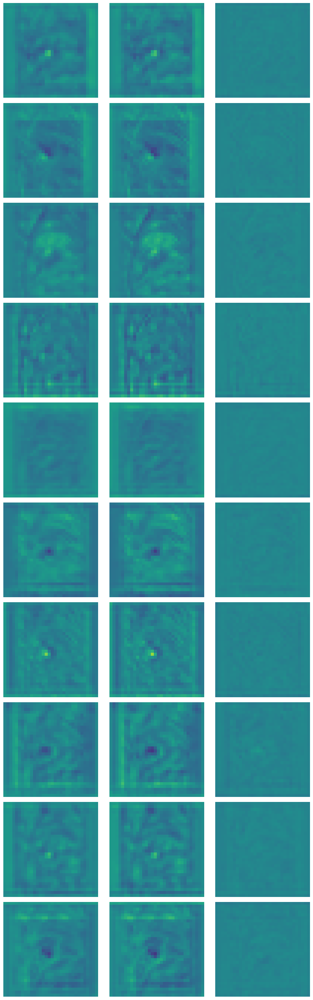

In [61]:
n = 10
fig, axes = plt.subplots(n, 3, figsize=(n, 3 * n), sharex=True, sharey=True)
#5 * len(act_in))
for i in range(len(act_in)):
    if i == n:
        break
    vmin = min(act_in[0].min(), act_out[0].min(), (act_in[0] - act_out[0]).min())
    vmax = max(act_in[0].max(), act_out[0].max(), (act_in[0] - act_out[0]).max())   
    axes[i, 0].imshow(act_in[0, i], vmin=vmin, vmax=vmax)
    axes[i, 1].imshow(act_out[0, i], vmin=vmin, vmax=vmax)
    axes[i, 2].imshow(act_in[0, i] - act_out[0, i], vmin=vmin, vmax=vmax)


for ax in axes.ravel():
    ax.set_axis_off()
plt.tight_layout()
# plt.imshow(act_out[0, 0].detach().cpu())

In [20]:
act_in.shape

torch.Size([1, 64, 32, 32])

In [6]:
## Sanity Check if config is as expected
print(OmegaConf.to_yaml(cfg))

debug: true
wandb:
  log: true
  project: MICCAI2023-extension
fs:
  root: ../../
data:
  brain:
    data_path: data/conp-dataset/projects/calgary-campinas/CC359/Reconstructed/
  heart:
    data_path: data/mnm/
unet:
  brain:
    pre: calgary_unet
    n_chans_in: 1
    n_filters_init: 8
    n_chans_out: 1
    training:
      save_loc: pre-trained
      train_site: 6
      augment: true
      validation: true
      batch_size: 32
      num_batches_per_epoch: 250
      epochs: 250
      patience: 4
      lr: 0.001
  heart:
    pre: monai-64-4-4
    n_chans_in: 1
    n_filters_init: 64
    n_chans_out: 4
    training:
      save_loc: pre-trained
      augment: true
      validation: true
      batch_size: 32
      num_batches_per_epoch: 250
      num_val_batches_per_epoch: 50
      epochs: 250
      patience: 4
      lr: 0.001
    arch: monai
    depth: 4
    num_res_units: 4
run:
  iteration: 0
  data_key: heart
eval:
  data:
    training: true
    validation: true
    testing: all
    s

## General Eval Pipeline

In [7]:

#####################################################
### From eval.unet_test. Modify to fit your needs ###
#####################################################

from typing import Dict
from omegaconf import OmegaConf
import pandas as pd
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

from utils import  epoch_average
from losses import (
    DiceScoreCalgary, 
    DiceScoreMMS
)



def get_df_from_dict(
    cfg: OmegaConf,
    metrics: Dict
):
    # convert dict into seaborn-friendly pandas format
    df = pd.DataFrame.from_dict(metrics).T
    df['Domain'] = df.index
    df.reset_index(drop=True, inplace=True)
    df = pd.melt(
        df, 
        id_vars=['Domain'],
        value_vars=df.columns.drop('Domain')
    )
    # add additional identifiers from config
    df['Iteration'] = cfg.run.iteration
    df['Model'] = cfg.unet[cfg.run.data_key].pre
    df['Data'] = cfg.run.data_key

    return df


def eval_set(
    cfg: OmegaConf,
    model: nn.Module,
    dataset: Dataset
) -> Dict:
    if cfg.run.data_key == 'brain':
        dataset.volume_wise = True
        dataloader = DataLoader(
            dataset,
            batch_size=32,
            shuffle=False,
            drop_last=False
        )
        eval_metrics = {
            'Volumetric Dice': DiceScoreCalgary(),
            # Surface Dice is not defined for fragmented volumes, which we get
            # by subsetting above. The original eval function in
            # eval.unet_test does support surface Dice but not subsetting.
            # 'Surface Dice': SurfaceDiceCalgary() 
        }
        metrics = eval_brain_set(
            model=model, 
            dataloader=dataloader, 
            eval_metrics=eval_metrics
        )

    elif cfg.run.data_key == 'heart':
        dataloader = DataLoader(dataset, 
            batch_size=32, 
            shuffle=False, 
            drop_last=False
        )
        eval_metrics = {
            "Volumetric Dice": DiceScoreMMS()
        }
        metrics = eval_heart_set(
            model=model, 
            dataloader=dataloader, 
            eval_metrics=eval_metrics
        )
    
    else:
        raise ValueError(
            f'Invalid data key. No dataset named {cfg.run.data_key}'
        )

    return metrics



@torch.no_grad()
def eval_brain_set(
    model: nn.Module, 
    dataloader: DataLoader, 
    eval_metrics: Dict
) -> Dict:
    model.eval()
    batch_sizes = []
    epoch_metrics = {key: [] for key in eval_metrics.keys()}
    for batch in dataloader:
        input_ = batch['input']
        target = batch['target']
        batch_sizes.append(input_.shape[0])
        net_out = model(input_.cuda()).detach().cpu()
        for key, metric in eval_metrics.items():
            epoch_metrics[key].append(metric(net_out,target).detach().mean().cpu())

    for key, epoch_scores in epoch_metrics.items():
        epoch_metrics[key] = epoch_average(epoch_scores, batch_sizes)

    return epoch_metrics



@torch.no_grad()
def eval_heart_set(
    model: nn.Module, 
    dataloader: DataLoader, 
    eval_metrics: Dict
) -> Dict:
    model.eval()
    epoch_metrics = {key: [] for key in eval_metrics.keys()}
    # saves batch sizes for each batch for averaging
    batch_sizes = []
    for batch in dataloader:
        input_ = batch['input']
        target = batch['target'].cuda()
        # convert -1 labels to background
        target[target == -1] = 0
        # convert to one-hot encoding
        target = F.one_hot(
            target.long(), 
            num_classes=4
        ).squeeze(1).permute(0,3,1,2)
        # get model output
        net_out = model(input_.cuda())
        
        batch_sizes.append(input_.shape[0])
        for key, metric in eval_metrics.items():
            epoch_metrics[key].append(
                metric(net_out, target).detach().mean().cpu()
            )
            
    for key, epoch_scores in epoch_metrics.items():
        epoch_metrics[key] = epoch_average(epoch_scores, batch_sizes)
        
    return epoch_metrics

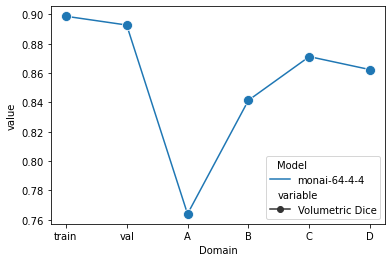

In [8]:
metrics = {}

for key in data.keys():
    metrics[key] = eval_set(
        cfg=cfg,
        model=unet,
        dataset=data[key]
    )

df = get_df_from_dict(cfg, metrics)

sns.lineplot(
    data=df, 
    x='Domain', 
    y='value', 
    hue='Model',
    style='variable',
    markers=True, 
    dashes=False, 
    markersize=10, 
    marker='x'
)
plt.show()

## Image selection and analysis

In [9]:
# select single image
print(f'\nAvailable datasets are:')
for key in data:
    print(f'  {key}: {len(data[key])} images')


domain = 'A'
idx    = 20
image, seg_mask, voxel_spacing = data[domain][idx].values()


Available datasets are:
  train: 50 images
  val: 50 images
  A: 50 images
  B: 50 images
  C: 50 images
  D: 50 images


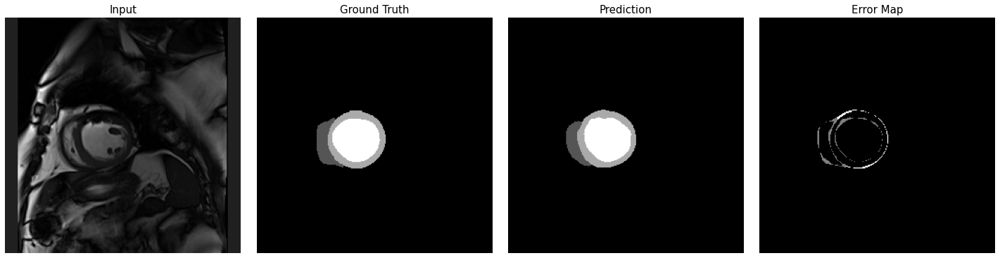

In [10]:


# segment image
with torch.no_grad():
    net_out = unet(image.unsqueeze(0).cuda()).detach().cpu()
    if DATA_KEY == 'brain':
        prediction = (net_out[0] > 0.5) * 1
    elif DATA_KEY == 'heart':
        prediction = net_out.argmax(1)
    error_map = (seg_mask - prediction).abs()


# plot results
def plot_side_by_side(
    images: List[Tensor], 
    titles: List[str] = None, 
    cmap: str = 'gray'
):
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=(n * 5, 5))
    
    if n == 1:  # If only one image, wrap axes in a list to make iterable
        axes = [axes]
    
    for i, ax in enumerate(axes):
        ax.imshow(images[i], cmap=cmap)
        ax.axis('off')
        if titles:
            ax.set_title(titles[i], fontsize=15)
        
    plt.tight_layout()
    return fig


fig = plot_side_by_side(
    images = [
        image[0], 
        seg_mask[0], 
        prediction[0], 
        error_map[0],
    ], 
    titles = [
        'Input', 
        'Ground Truth', 
        'Prediction',
        'Error Map',
    ]  # comment to hide titles
)